In [3]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import imageio
import os
from glob import glob
import datetime

import tensorflow as tf
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, f1_score
from raunet.utils.helper_metric_functions import make_confusion_matrix, plot_loss_curves, calculate_results
from raunet.utils.load_and_visualize_data import loadData, show_images
from raunet.utils.models import Attention_residual_unet_model
from raunet.utils.helper_loss_functions import jaccard_loss_function, jaccard_coef
from tensorflow.keras.callbacks import LearningRateScheduler, ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, Callback

AttributeError: module 'keras.utils.generic_utils' has no attribute 'get_custom_objects'

#### Hyperparameters

In [2]:
batch_size = 32
num_filters = 16 # Changed from 16
filter_multiplier = [4,4,8,16]
dropout = 0.2
batch_norm = True
kernel_size = 3
epochs = 500
learning_rate = 0.001
loss_func = jaccard_loss_function
size = 128
shape = (128, 128, 1)

In [3]:
# root folder
root_path = "Dataset_BUSI_with_GT/"

# classes in the analyzed data
classes = os.listdir(root_path)
classes

['benign', 'malignant', 'normal']

In [4]:
# Amount of images
image_paths_bening = glob(root_path + f"{classes[0]}"+"/*).png")
image_paths_malignant = glob(root_path + f"{classes[1]}"+"/*).png")
image_paths_normal = glob(root_path + f"{classes[2]}"+"/*).png")
print(f"Total number of images is:\nNORMAL - {len(image_paths_normal)} \
                                  \nMALIGNANT - {len(image_paths_malignant)} \
                                  \nBENING - {len(image_paths_bening)}")

Total number of images is:
NORMAL - 133                                   
MALIGNANT - 210                                   
BENING - 437


### We can see that we have a class imbalance problem in data

In [5]:
train_data, test_data, X_train, X_test, y_train, y_test = loadData(path="Dataset_BUSI_with_GT", files=True, 
                                                          batch_size=batch_size, size=size, split=0.10) 
# Changed split from 0.10 

Used memory to store the float image dataset is:  48.75
Used memory to store the float mask dataset is:  48.75


In [6]:
X_train.min(), X_train.max(), X_test.min(), X_test.max()

(0.0, 1.0, 0.0, 1.0)

In [7]:
y_train.min(), y_train.max(), y_test.min(), y_test.max()

(0.0, 1.0, 0.0, 1.0)

#### Visualize the data

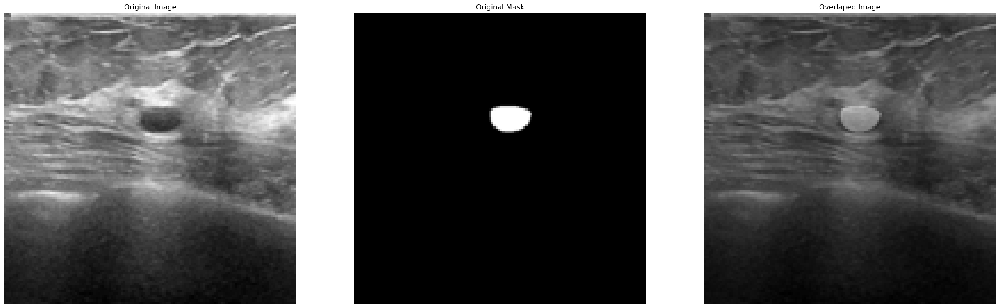

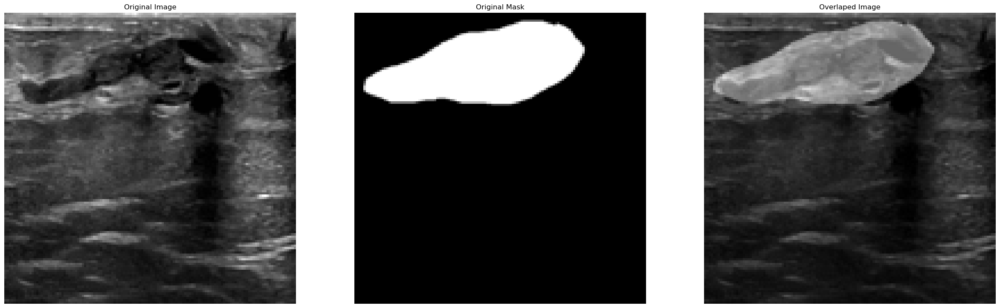

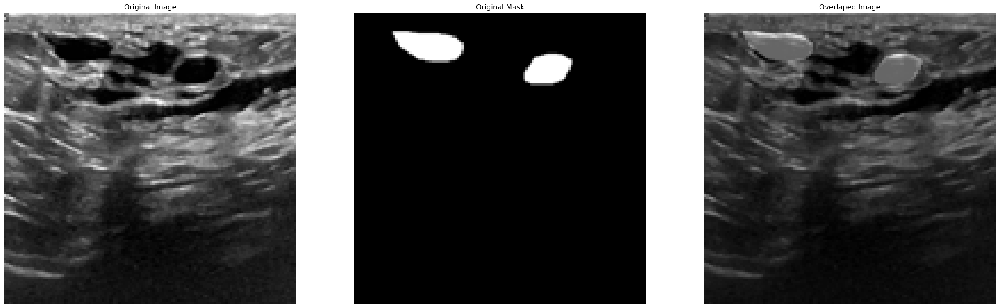

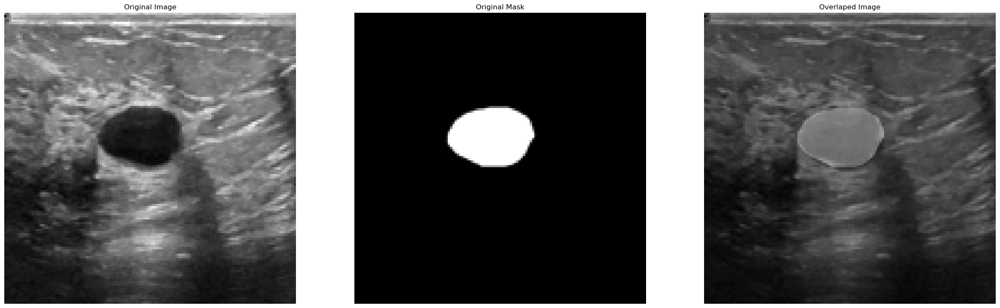

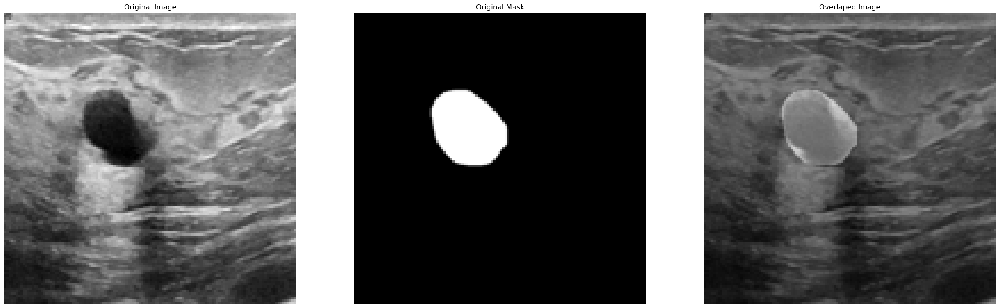

In [8]:
show_images(train_data)

#### Callbacks
 - ShowProgress
    * Creates model prediction during training process and visualize it
 - Tensorboard
    * Creates tensorborad which visualize different attempts to learnign process
 - Early Stopping
    * Stops training process if our model will not improve loss func after 15 epochs
 - Learning Rate Reducer
    * Reduce learning rate by sqrt(0.1) if the loss does not improve in 5 epochs
 - Model Checkpoint
    * Save model best weights and bias

In [9]:
#Callback
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch+1)%5==0:
            show_images(test_data, model=self.model, explain=True, n_images=2, SIZE=(25,10))

def create_tensorboard_callback(dir_name, experiment_name):
    """
        Creates a TensorBoard callback instand to store log files.
        Stores log files with the filepath:
        "dir_name/experiment_name/current_datetime/"
    Args:
        dir_name: target directory to store TensorBoard log files
        experiment_name: name of experiment directory (e.g. efficientnet_model_1)
    """
    log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
      log_dir=log_dir)
    print(f"Saving TensorBoard log files to: {log_dir}")
    return tensorboard_callback

            
# reduce learning rate by sqrt(0.1) if the loss does not improve in 5 epochs
lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=10,
                               verbose=1,
                               min_lr=0.5e-12)

# save weights for future use (e.g. reload parameters w/o training)
model_checkpoint = ModelCheckpoint(filepath="training_inzynierka/Attention_Residual_Unet_30_excel.h5",
                             monitor='val_loss',
                             verbose=1,
                             save_best_only=True)

# stop if our model doesn't improve
early_stopping = EarlyStopping(monitor='val_loss',
                               patience=35,
                               mode='auto',
                               restore_best_weights=True)

callbacks = [ShowProgress(), lr_reducer, model_checkpoint, early_stopping, 
             create_tensorboard_callback("training_inzynierka", "Attention_Residual_Unet_30_excel")]

Saving TensorBoard log files to: training_inzynierka/Attention_Residual_Unet_30_excel/20221218-212252


In [10]:
attemption_residual_unet = Attention_residual_unet_model(shape = shape, 
                                                         num_filters = num_filters,
                                                         filter_multiplier = filter_multiplier,
                                                         kernel_size = kernel_size,
                                                         dropout = dropout,
                                                         batch_norm = batch_norm,
                                                         l_r = learning_rate,
                                                         loss_func = loss_func)

In [11]:
attemption_residual_unet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 16  160         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

 activation_6 (Activation)      (None, 16, 16, 128)  0           ['batch_normalization_9[0][0]']  
                                                                                                  
 dropout_2 (Dropout)            (None, 16, 16, 128)  0           ['activation_6[0][0]']           
                                                                                                  
 conv2d_10 (Conv2D)             (None, 16, 16, 128)  147584      ['dropout_2[0][0]']              
                                                                                                  
 conv2d_11 (Conv2D)             (None, 16, 16, 128)  8320        ['max_pooling2d_2[0][0]']        
                                                                                                  
 batch_normalization_10 (BatchN  (None, 16, 16, 128)  512        ['conv2d_10[0][0]']              
 ormalization)                                                                                    
          

 ormalization)                                                                                    
                                                                                                  
 activation_13 (Activation)     (None, 16, 16, 128)  0           ['batch_normalization_17[0][0]'] 
                                                                                                  
 dropout_4 (Dropout)            (None, 16, 16, 128)  0           ['activation_13[0][0]']          
                                                                                                  
 conv2d_20 (Conv2D)             (None, 16, 16, 128)  147584      ['dropout_4[0][0]']              
                                                                                                  
 conv2d_21 (Conv2D)             (None, 16, 16, 128)  32896       ['concatenate[0][0]']            
                                                                                                  
 batch_nor

 ormalization)                                                                                    
                                                                                                  
 activation_20 (Activation)     (None, 32, 32, 64)   0           ['batch_normalization_25[0][0]'] 
                                                                                                  
 conv2d_31 (Conv2D)             (None, 32, 32, 64)   4160        ['activation_20[0][0]']          
                                                                                                  
 conv2d_transpose_4 (Conv2DTran  (None, 32, 32, 64)  36928       ['conv2d_31[0][0]']              
 spose)                                                                                           
                                                                                                  
 conv2d_30 (Conv2D)             (None, 32, 32, 64)   16448       ['activation_3[0][0]']           
          

                                                                                                  
 lambda_3 (Lambda)              (None, 128, 128, 16  0           ['up_sampling2d_3[0][0]']        
                                )                                                                 
                                                                                                  
 multiply_3 (Multiply)          (None, 128, 128, 16  0           ['lambda_3[0][0]',               
                                )                                 'activation_1[0][0]']           
                                                                                                  
 attention_4 (Conv2D)           (None, 128, 128, 16  272         ['multiply_3[0][0]']             
                                )                                                                 
                                                                                                  
 conv2d_tr

Epoch 1/500
22/22 [==============================] - ETA: 0s - loss: 0.8292 - iou_score: 0.2157
Epoch 1: val_loss improved from inf to 0.86800, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [==============================] - 32s 715ms/step - loss: 0.8292 - iou_score: 0.2157 - val_loss: 0.8680 - val_iou_score: 0.1981 - lr: 0.0010
Epoch 2/500
22/22 [==============================] - ETA: 0s - loss: 0.6054 - iou_score: 0.4010
Epoch 2: val_loss did not improve from 0.86800
22/22 [==============================] - 8s 361ms/step - loss: 0.6054 - iou_score: 0.4010 - val_loss: 0.8934 - val_iou_score: 0.1127 - lr: 0.0010
Epoch 3/500
22/22 [==============================] - ETA: 0s - loss: 0.5898 - iou_score: 0.4107
Epoch 3: val_loss improved from 0.86800 to 0.85239, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [==============================] - 8s 386ms/step - loss: 0.5898 - iou_score: 0.4107 - val_loss: 0.8524 - val_iou_score: 0.

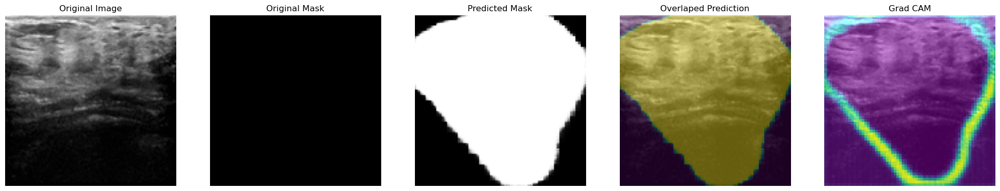

1/1 [==============================] - 0s 22ms/step


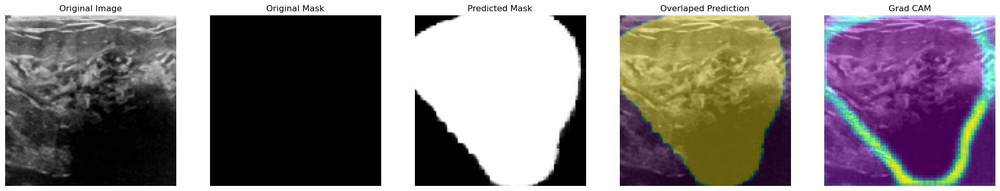


Epoch 5: val_loss did not improve from 0.85239
22/22 [==============================] - 11s 503ms/step - loss: 0.4989 - iou_score: 0.5016 - val_loss: 0.8952 - val_iou_score: 0.1066 - lr: 0.0010
Epoch 6/500
22/22 [==============================] - ETA: 0s - loss: 0.5087 - iou_score: 0.4921
Epoch 6: val_loss did not improve from 0.85239
22/22 [==============================] - 8s 363ms/step - loss: 0.5087 - iou_score: 0.4921 - val_loss: 0.9003 - val_iou_score: 0.1020 - lr: 0.0010
Epoch 7/500
22/22 [==============================] - ETA: 0s - loss: 0.4827 - iou_score: 0.5179
Epoch 7: val_loss did not improve from 0.85239
22/22 [==============================] - 8s 362ms/step - loss: 0.4827 - iou_score: 0.5179 - val_loss: 0.8619 - val_iou_score: 0.1398 - lr: 0.0010
Epoch 8/500
22/22 [==============================] - ETA: 0s - loss: 0.4655 - iou_score: 0.5350
Epoch 8: val_loss improved from 0.85239 to 0.82613, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [

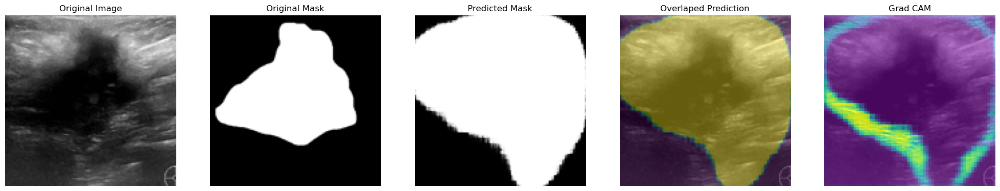

1/1 [==============================] - 0s 27ms/step


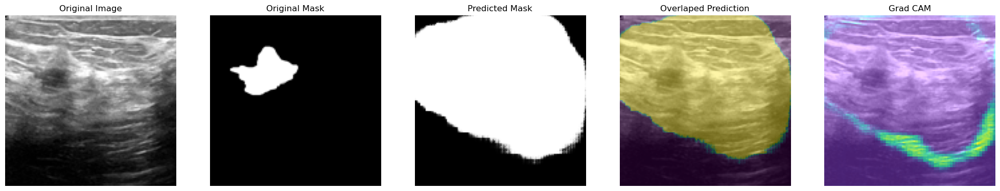


Epoch 10: val_loss did not improve from 0.82613
22/22 [==============================] - 9s 421ms/step - loss: 0.4818 - iou_score: 0.5188 - val_loss: 0.8938 - val_iou_score: 0.1080 - lr: 0.0010
Epoch 11/500
22/22 [==============================] - ETA: 0s - loss: 0.4478 - iou_score: 0.5526
Epoch 11: val_loss did not improve from 0.82613
22/22 [==============================] - 8s 364ms/step - loss: 0.4478 - iou_score: 0.5526 - val_loss: 0.8511 - val_iou_score: 0.1504 - lr: 0.0010
Epoch 12/500
22/22 [==============================] - ETA: 0s - loss: 0.4815 - iou_score: 0.5189
Epoch 12: val_loss did not improve from 0.82613
22/22 [==============================] - 8s 367ms/step - loss: 0.4815 - iou_score: 0.5189 - val_loss: 0.8411 - val_iou_score: 0.1599 - lr: 0.0010
Epoch 13/500
22/22 [==============================] - ETA: 0s - loss: 0.4445 - iou_score: 0.5557
Epoch 13: val_loss improved from 0.82613 to 0.82007, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
2

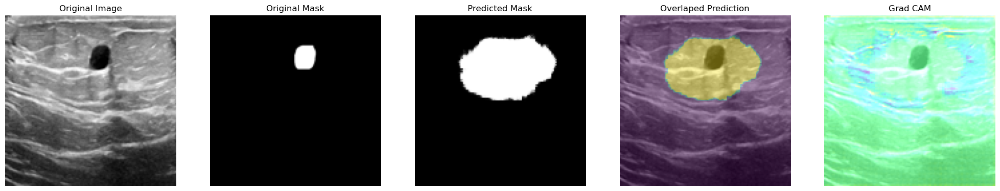

1/1 [==============================] - 0s 28ms/step


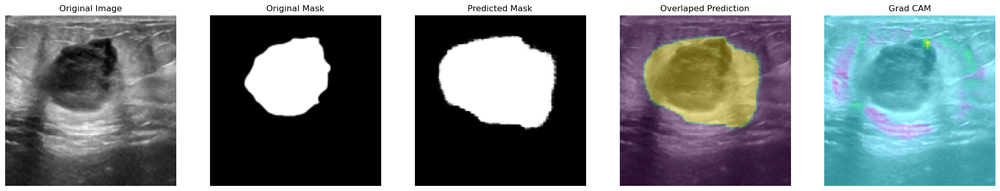


Epoch 15: val_loss improved from 0.80894 to 0.76129, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [==============================] - 10s 445ms/step - loss: 0.4019 - iou_score: 0.5986 - val_loss: 0.7613 - val_iou_score: 0.2350 - lr: 0.0010
Epoch 16/500
22/22 [==============================] - ETA: 0s - loss: 0.3887 - iou_score: 0.6118
Epoch 16: val_loss improved from 0.76129 to 0.73917, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [==============================] - 9s 390ms/step - loss: 0.3887 - iou_score: 0.6118 - val_loss: 0.7392 - val_iou_score: 0.2550 - lr: 0.0010
Epoch 17/500
22/22 [==============================] - ETA: 0s - loss: 0.3941 - iou_score: 0.6068
Epoch 17: val_loss did not improve from 0.73917
22/22 [==============================] - 8s 370ms/step - loss: 0.3941 - iou_score: 0.6068 - val_loss: 0.7849 - val_iou_score: 0.2104 - lr: 0.0010
Epoch 18/500
22/22 [==============================] - ETA: 0s - loss

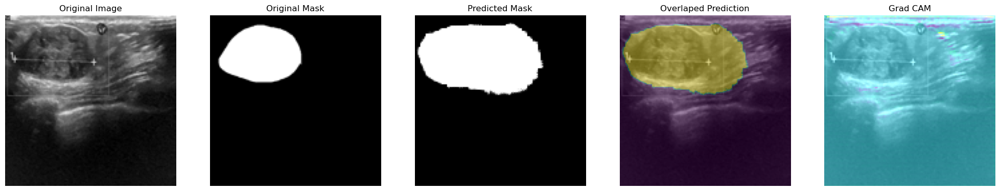

1/1 [==============================] - 0s 27ms/step


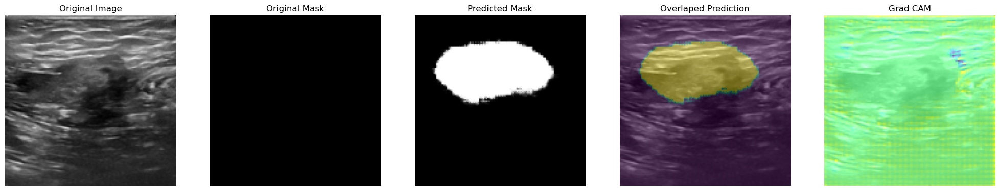


Epoch 20: val_loss did not improve from 0.62749
22/22 [==============================] - 9s 426ms/step - loss: 0.4359 - iou_score: 0.5650 - val_loss: 0.6760 - val_iou_score: 0.3176 - lr: 0.0010
Epoch 21/500
22/22 [==============================] - ETA: 0s - loss: 0.4322 - iou_score: 0.5683
Epoch 21: val_loss improved from 0.62749 to 0.52138, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [==============================] - 9s 389ms/step - loss: 0.4322 - iou_score: 0.5683 - val_loss: 0.5214 - val_iou_score: 0.4715 - lr: 0.0010
Epoch 22/500
22/22 [==============================] - ETA: 0s - loss: 0.3947 - iou_score: 0.6056
Epoch 22: val_loss did not improve from 0.52138
22/22 [==============================] - 8s 367ms/step - loss: 0.3947 - iou_score: 0.6056 - val_loss: 0.8027 - val_iou_score: 0.1962 - lr: 0.0010
Epoch 23/500
22/22 [==============================] - ETA: 0s - loss: 0.4202 - iou_score: 0.5800
Epoch 23: val_loss did not improve from 0.52138
2

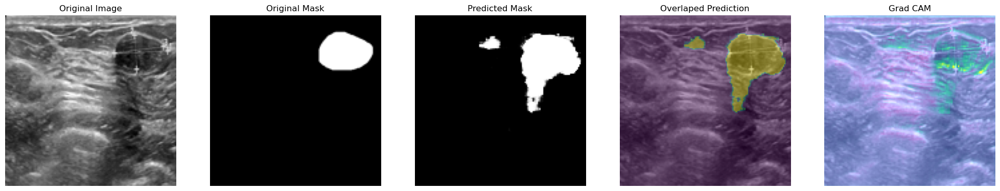

1/1 [==============================] - 0s 30ms/step


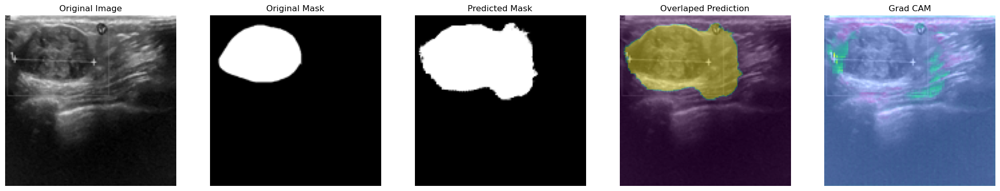


Epoch 25: val_loss did not improve from 0.52138
22/22 [==============================] - 9s 423ms/step - loss: 0.4033 - iou_score: 0.5972 - val_loss: 0.6629 - val_iou_score: 0.3317 - lr: 0.0010
Epoch 26/500
22/22 [==============================] - ETA: 0s - loss: 0.4058 - iou_score: 0.5946
Epoch 26: val_loss did not improve from 0.52138
22/22 [==============================] - 8s 370ms/step - loss: 0.4058 - iou_score: 0.5946 - val_loss: 0.5284 - val_iou_score: 0.4706 - lr: 0.0010
Epoch 27/500
22/22 [==============================] - ETA: 0s - loss: 0.4322 - iou_score: 0.5686
Epoch 27: val_loss did not improve from 0.52138
22/22 [==============================] - 8s 370ms/step - loss: 0.4322 - iou_score: 0.5686 - val_loss: 0.5432 - val_iou_score: 0.4599 - lr: 0.0010
Epoch 28/500
22/22 [==============================] - ETA: 0s - loss: 0.3670 - iou_score: 0.6336
Epoch 28: val_loss improved from 0.52138 to 0.43437, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
2

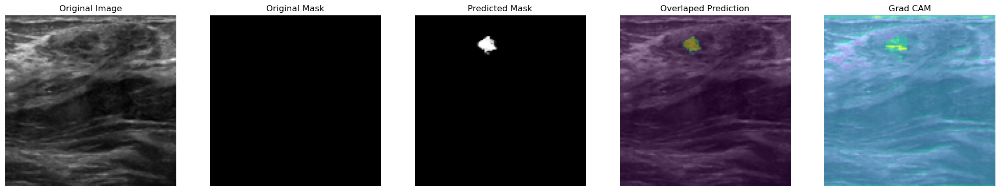

1/1 [==============================] - 0s 31ms/step


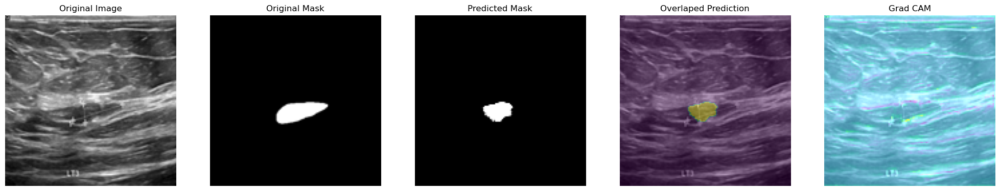


Epoch 30: val_loss improved from 0.43437 to 0.36569, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [==============================] - 10s 447ms/step - loss: 0.3315 - iou_score: 0.6686 - val_loss: 0.3657 - val_iou_score: 0.6336 - lr: 0.0010
Epoch 31/500
22/22 [==============================] - ETA: 0s - loss: 0.3195 - iou_score: 0.6808
Epoch 31: val_loss did not improve from 0.36569
22/22 [==============================] - 8s 370ms/step - loss: 0.3195 - iou_score: 0.6808 - val_loss: 0.4084 - val_iou_score: 0.5883 - lr: 0.0010
Epoch 32/500
22/22 [==============================] - ETA: 0s - loss: 0.3589 - iou_score: 0.6417
Epoch 32: val_loss did not improve from 0.36569
22/22 [==============================] - 8s 370ms/step - loss: 0.3589 - iou_score: 0.6417 - val_loss: 0.4313 - val_iou_score: 0.5776 - lr: 0.0010
Epoch 33/500
22/22 [==============================] - ETA: 0s - loss: 0.3407 - iou_score: 0.6597
Epoch 33: val_loss did not improve from 0.36569


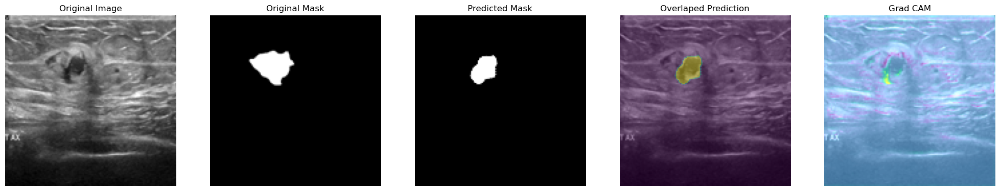

1/1 [==============================] - 0s 27ms/step


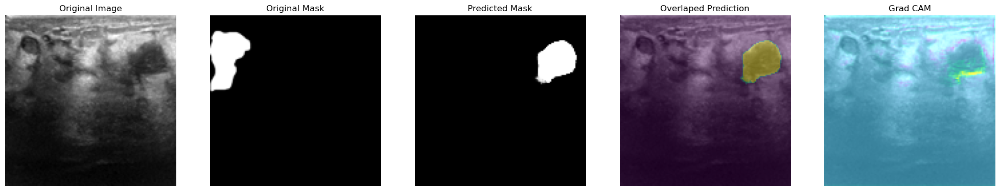


Epoch 35: val_loss did not improve from 0.36569
22/22 [==============================] - 9s 425ms/step - loss: 0.3163 - iou_score: 0.6841 - val_loss: 0.4256 - val_iou_score: 0.5767 - lr: 0.0010
Epoch 36/500
22/22 [==============================] - ETA: 0s - loss: 0.3152 - iou_score: 0.6852
Epoch 36: val_loss improved from 0.36569 to 0.35591, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [==============================] - 9s 391ms/step - loss: 0.3152 - iou_score: 0.6852 - val_loss: 0.3559 - val_iou_score: 0.6417 - lr: 0.0010
Epoch 37/500
22/22 [==============================] - ETA: 0s - loss: 0.2994 - iou_score: 0.7010
Epoch 37: val_loss did not improve from 0.35591
22/22 [==============================] - 8s 371ms/step - loss: 0.2994 - iou_score: 0.7010 - val_loss: 0.4382 - val_iou_score: 0.5636 - lr: 0.0010
Epoch 38/500
22/22 [==============================] - ETA: 0s - loss: 0.3029 - iou_score: 0.6974
Epoch 38: val_loss did not improve from 0.35591
2

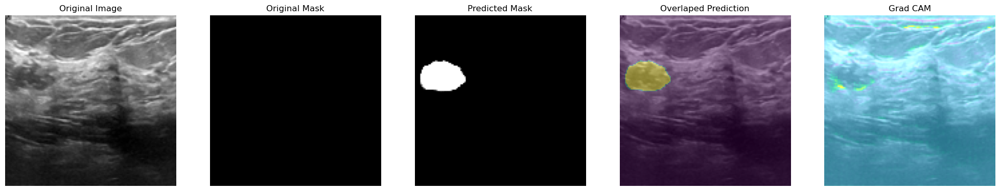

1/1 [==============================] - 0s 28ms/step


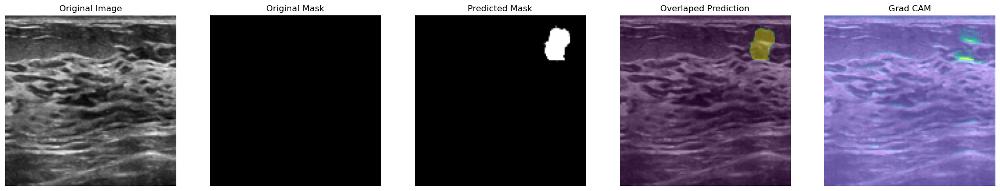


Epoch 40: val_loss did not improve from 0.35591
22/22 [==============================] - 9s 424ms/step - loss: 0.3379 - iou_score: 0.6626 - val_loss: 0.4999 - val_iou_score: 0.5209 - lr: 0.0010
Epoch 41/500
22/22 [==============================] - ETA: 0s - loss: 0.3181 - iou_score: 0.6824
Epoch 41: val_loss improved from 0.35591 to 0.34826, saving model to training_inzynierka\Attention_Residual_Unet_30_excel.h5
22/22 [==============================] - 9s 389ms/step - loss: 0.3181 - iou_score: 0.6824 - val_loss: 0.3483 - val_iou_score: 0.6473 - lr: 0.0010
Epoch 42/500
22/22 [==============================] - ETA: 0s - loss: 0.3924 - iou_score: 0.6075
Epoch 42: val_loss did not improve from 0.34826
22/22 [==============================] - 8s 368ms/step - loss: 0.3924 - iou_score: 0.6075 - val_loss: 0.8316 - val_iou_score: 0.1777 - lr: 0.0010
Epoch 43/500
22/22 [==============================] - ETA: 0s - loss: 0.5052 - iou_score: 0.4953
Epoch 43: val_loss did not improve from 0.34826
2

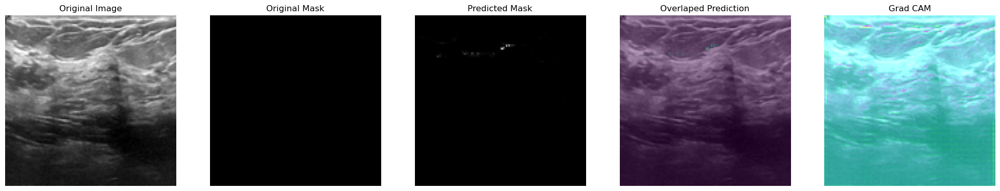

1/1 [==============================] - 0s 30ms/step


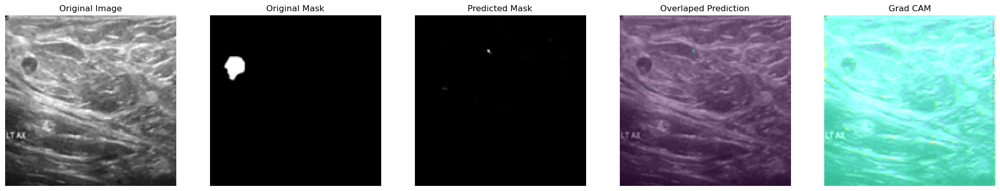


Epoch 45: val_loss did not improve from 0.34826
22/22 [==============================] - 9s 424ms/step - loss: 0.3890 - iou_score: 0.6111 - val_loss: 0.3757 - val_iou_score: 0.6263 - lr: 0.0010
Epoch 46/500
22/22 [==============================] - ETA: 0s - loss: 0.4036 - iou_score: 0.5970
Epoch 46: val_loss did not improve from 0.34826
22/22 [==============================] - 8s 366ms/step - loss: 0.4036 - iou_score: 0.5970 - val_loss: 0.5232 - val_iou_score: 0.4643 - lr: 0.0010
Epoch 47/500
22/22 [==============================] - ETA: 0s - loss: 0.3552 - iou_score: 0.6449
Epoch 47: val_loss did not improve from 0.34826
22/22 [==============================] - 8s 366ms/step - loss: 0.3552 - iou_score: 0.6449 - val_loss: 0.4552 - val_iou_score: 0.5540 - lr: 0.0010
Epoch 48/500
22/22 [==============================] - ETA: 0s - loss: 0.3657 - iou_score: 0.6345
Epoch 48: val_loss did not improve from 0.34826
22/22 [==============================] - 8s 371ms/step - loss: 0.3657 - iou_sc

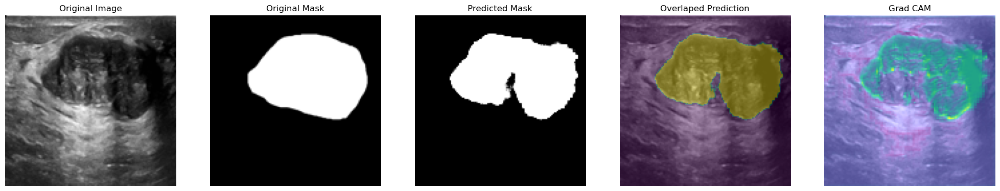

1/1 [==============================] - 0s 28ms/step


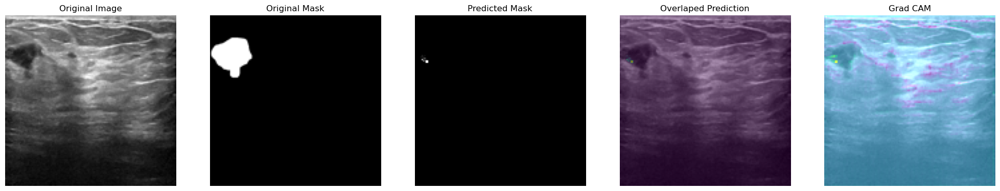


Epoch 50: val_loss did not improve from 0.34826
22/22 [==============================] - 10s 446ms/step - loss: 0.3204 - iou_score: 0.6801 - val_loss: 0.5126 - val_iou_score: 0.5132 - lr: 0.0010
Epoch 51/500
22/22 [==============================] - ETA: 0s - loss: 0.3206 - iou_score: 0.6799
Epoch 51: ReduceLROnPlateau reducing learning rate to 0.00031622778103685084.

Epoch 51: val_loss did not improve from 0.34826
22/22 [==============================] - 8s 363ms/step - loss: 0.3206 - iou_score: 0.6799 - val_loss: 0.4890 - val_iou_score: 0.5300 - lr: 0.0010
Epoch 52/500
22/22 [==============================] - ETA: 0s - loss: 0.3120 - iou_score: 0.6884
Epoch 52: val_loss did not improve from 0.34826
22/22 [==============================] - 8s 358ms/step - loss: 0.3120 - iou_score: 0.6884 - val_loss: 0.4123 - val_iou_score: 0.5993 - lr: 3.1623e-04
Epoch 53/500
22/22 [==============================] - ETA: 0s - loss: 0.2887 - iou_score: 0.7116
Epoch 53: val_loss did not improve from 0.

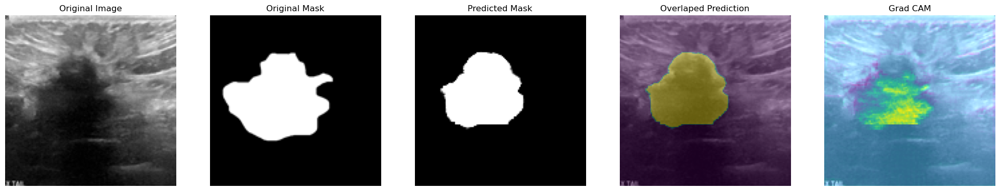

1/1 [==============================] - 0s 41ms/step


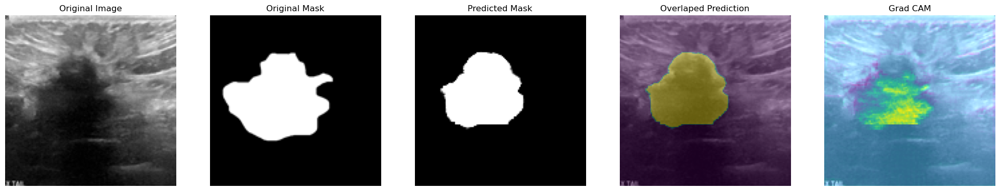


Epoch 55: val_loss did not improve from 0.33793
22/22 [==============================] - 9s 434ms/step - loss: 0.2749 - iou_score: 0.7256 - val_loss: 0.3447 - val_iou_score: 0.6573 - lr: 3.1623e-04
Epoch 56/500
22/22 [==============================] - ETA: 0s - loss: 0.2614 - iou_score: 0.7389
Epoch 56: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 363ms/step - loss: 0.2614 - iou_score: 0.7389 - val_loss: 0.3594 - val_iou_score: 0.6439 - lr: 3.1623e-04
Epoch 57/500
22/22 [==============================] - ETA: 0s - loss: 0.2604 - iou_score: 0.7397
Epoch 57: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 363ms/step - loss: 0.2604 - iou_score: 0.7397 - val_loss: 0.3703 - val_iou_score: 0.6331 - lr: 3.1623e-04
Epoch 58/500
22/22 [==============================] - ETA: 0s - loss: 0.2581 - iou_score: 0.7425
Epoch 58: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 367ms/step - loss: 0.2

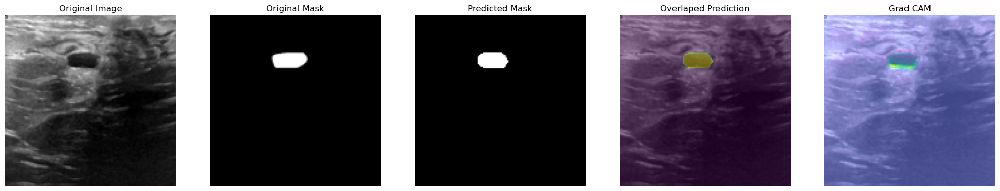

1/1 [==============================] - 0s 30ms/step


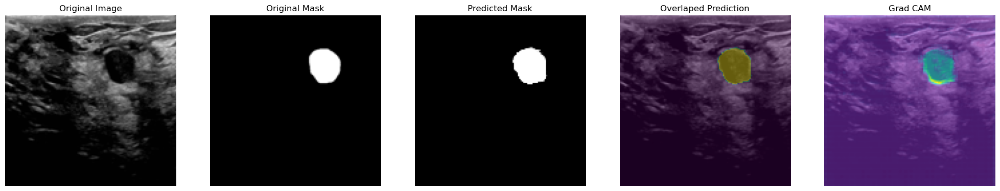


Epoch 60: val_loss did not improve from 0.33793
22/22 [==============================] - 9s 422ms/step - loss: 0.2521 - iou_score: 0.7484 - val_loss: 0.3745 - val_iou_score: 0.6311 - lr: 3.1623e-04
Epoch 61/500
22/22 [==============================] - ETA: 0s - loss: 0.2511 - iou_score: 0.7494
Epoch 61: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 369ms/step - loss: 0.2511 - iou_score: 0.7494 - val_loss: 0.3875 - val_iou_score: 0.6221 - lr: 3.1623e-04
Epoch 62/500
22/22 [==============================] - ETA: 0s - loss: 0.2468 - iou_score: 0.7534
Epoch 62: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 363ms/step - loss: 0.2468 - iou_score: 0.7534 - val_loss: 0.3709 - val_iou_score: 0.6362 - lr: 3.1623e-04
Epoch 63/500
22/22 [==============================] - ETA: 0s - loss: 0.2499 - iou_score: 0.7506
Epoch 63: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 369ms/step - loss: 0.2

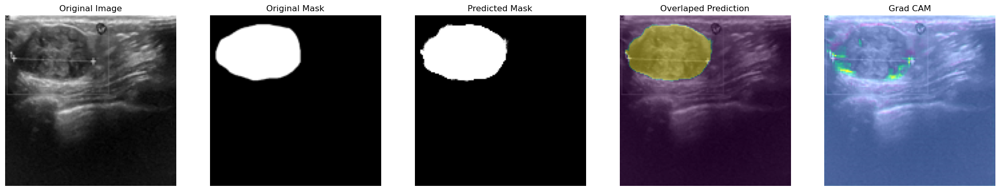

1/1 [==============================] - 0s 28ms/step


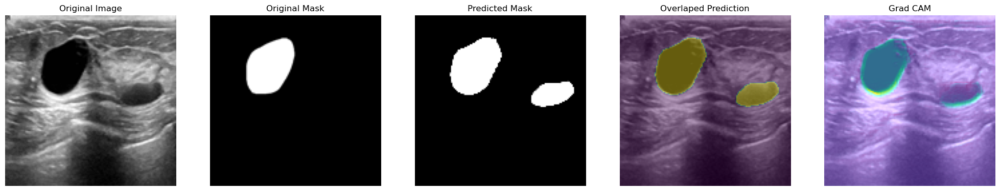


Epoch 65: val_loss did not improve from 0.33793
22/22 [==============================] - 9s 427ms/step - loss: 0.2334 - iou_score: 0.7670 - val_loss: 0.3590 - val_iou_score: 0.6455 - lr: 1.0000e-04
Epoch 66/500
22/22 [==============================] - ETA: 0s - loss: 0.2348 - iou_score: 0.7654
Epoch 66: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 372ms/step - loss: 0.2348 - iou_score: 0.7654 - val_loss: 0.3563 - val_iou_score: 0.6483 - lr: 1.0000e-04
Epoch 67/500
22/22 [==============================] - ETA: 0s - loss: 0.2336 - iou_score: 0.7669
Epoch 67: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 373ms/step - loss: 0.2336 - iou_score: 0.7669 - val_loss: 0.3603 - val_iou_score: 0.6436 - lr: 1.0000e-04
Epoch 68/500
22/22 [==============================] - ETA: 0s - loss: 0.2404 - iou_score: 0.7591
Epoch 68: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 367ms/step - loss: 0.2

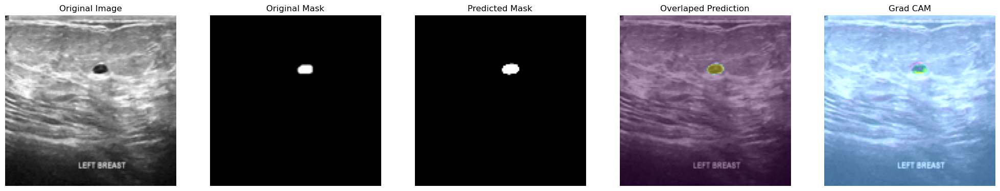

1/1 [==============================] - 0s 28ms/step


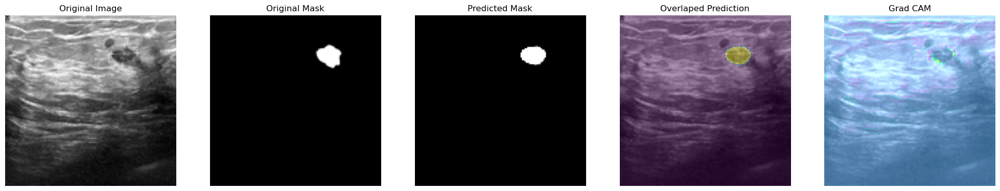


Epoch 70: val_loss did not improve from 0.33793
22/22 [==============================] - 9s 428ms/step - loss: 0.2310 - iou_score: 0.7695 - val_loss: 0.3610 - val_iou_score: 0.6444 - lr: 1.0000e-04
Epoch 71/500
22/22 [==============================] - ETA: 0s - loss: 0.2312 - iou_score: 0.7693
Epoch 71: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 372ms/step - loss: 0.2312 - iou_score: 0.7693 - val_loss: 0.3625 - val_iou_score: 0.6424 - lr: 1.0000e-04
Epoch 72/500
22/22 [==============================] - ETA: 0s - loss: 0.2374 - iou_score: 0.7631
Epoch 72: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 371ms/step - loss: 0.2374 - iou_score: 0.7631 - val_loss: 0.3647 - val_iou_score: 0.6412 - lr: 1.0000e-04
Epoch 73/500
22/22 [==============================] - ETA: 0s - loss: 0.2303 - iou_score: 0.7703
Epoch 73: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 370ms/step - loss: 0.2

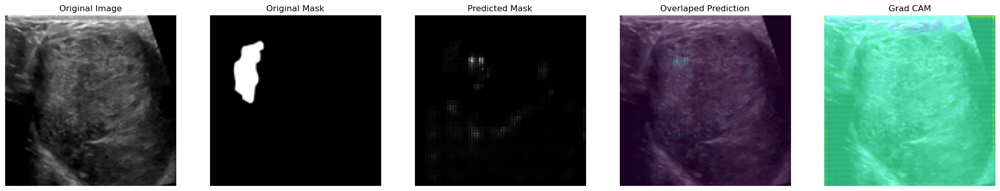

1/1 [==============================] - 0s 27ms/step


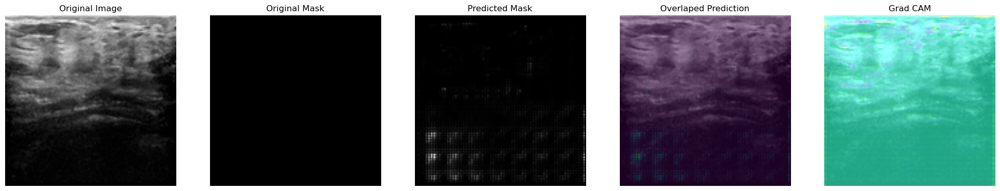


Epoch 75: val_loss did not improve from 0.33793
22/22 [==============================] - 9s 427ms/step - loss: 0.2248 - iou_score: 0.7756 - val_loss: 0.3597 - val_iou_score: 0.6440 - lr: 3.1623e-05
Epoch 76/500
22/22 [==============================] - ETA: 0s - loss: 0.2214 - iou_score: 0.7792
Epoch 76: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 370ms/step - loss: 0.2214 - iou_score: 0.7792 - val_loss: 0.3544 - val_iou_score: 0.6493 - lr: 3.1623e-05
Epoch 77/500
22/22 [==============================] - ETA: 0s - loss: 0.2297 - iou_score: 0.7707
Epoch 77: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 368ms/step - loss: 0.2297 - iou_score: 0.7707 - val_loss: 0.3505 - val_iou_score: 0.6530 - lr: 3.1623e-05
Epoch 78/500
22/22 [==============================] - ETA: 0s - loss: 0.2264 - iou_score: 0.7738
Epoch 78: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 369ms/step - loss: 0.2

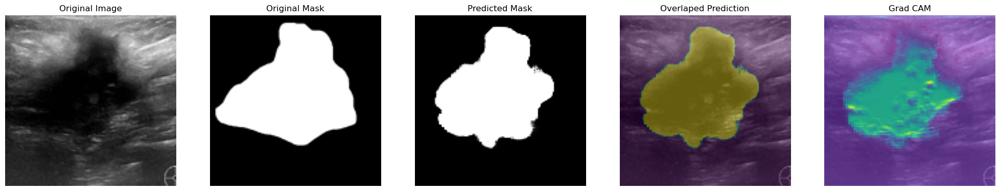

1/1 [==============================] - 0s 34ms/step


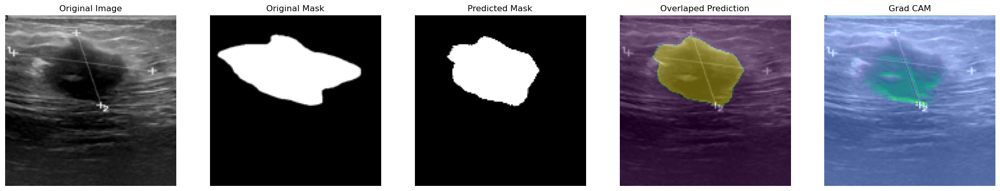


Epoch 80: val_loss did not improve from 0.33793
22/22 [==============================] - 9s 418ms/step - loss: 0.2247 - iou_score: 0.7758 - val_loss: 0.3530 - val_iou_score: 0.6503 - lr: 3.1623e-05
Epoch 81/500
22/22 [==============================] - ETA: 0s - loss: 0.2297 - iou_score: 0.7707
Epoch 81: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 363ms/step - loss: 0.2297 - iou_score: 0.7707 - val_loss: 0.3545 - val_iou_score: 0.6489 - lr: 3.1623e-05
Epoch 82/500
22/22 [==============================] - ETA: 0s - loss: 0.2224 - iou_score: 0.7781
Epoch 82: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 365ms/step - loss: 0.2224 - iou_score: 0.7781 - val_loss: 0.3527 - val_iou_score: 0.6505 - lr: 3.1623e-05
Epoch 83/500
22/22 [==============================] - ETA: 0s - loss: 0.2289 - iou_score: 0.7716
Epoch 83: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 364ms/step - loss: 0.2

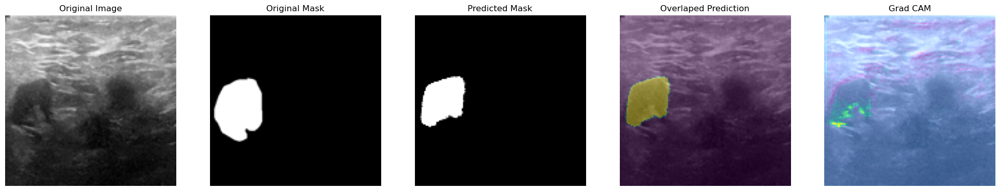

1/1 [==============================] - 0s 29ms/step


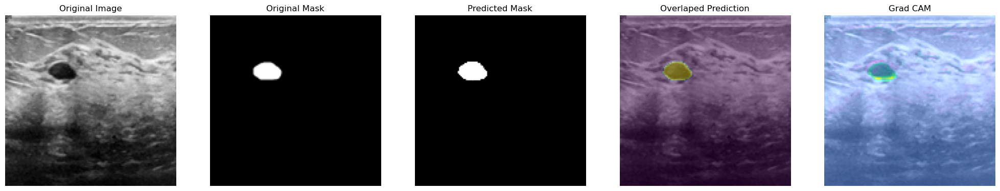


Epoch 85: val_loss did not improve from 0.33793
22/22 [==============================] - 9s 419ms/step - loss: 0.2214 - iou_score: 0.7787 - val_loss: 0.3516 - val_iou_score: 0.6515 - lr: 1.0000e-05
Epoch 86/500
22/22 [==============================] - ETA: 0s - loss: 0.2189 - iou_score: 0.7817
Epoch 86: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 362ms/step - loss: 0.2189 - iou_score: 0.7817 - val_loss: 0.3519 - val_iou_score: 0.6514 - lr: 1.0000e-05
Epoch 87/500
22/22 [==============================] - ETA: 0s - loss: 0.2215 - iou_score: 0.7787
Epoch 87: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 367ms/step - loss: 0.2215 - iou_score: 0.7787 - val_loss: 0.3520 - val_iou_score: 0.6513 - lr: 1.0000e-05
Epoch 88/500
22/22 [==============================] - ETA: 0s - loss: 0.2185 - iou_score: 0.7820
Epoch 88: val_loss did not improve from 0.33793
22/22 [==============================] - 8s 368ms/step - loss: 0.2

In [12]:
history = attemption_residual_unet.fit(X_train, y_train, 
                                       epochs = epochs, 
                                       batch_size = batch_size, 
                                       validation_data = (X_test, y_test), 
                                       callbacks = callbacks,
                                       verbose=1)

1/1 [==============================] - 0s 30ms/step


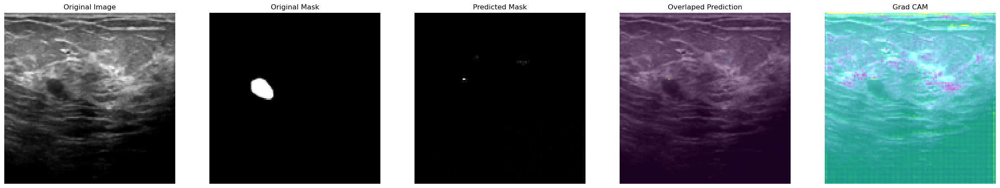

1/1 [==============================] - 0s 28ms/step


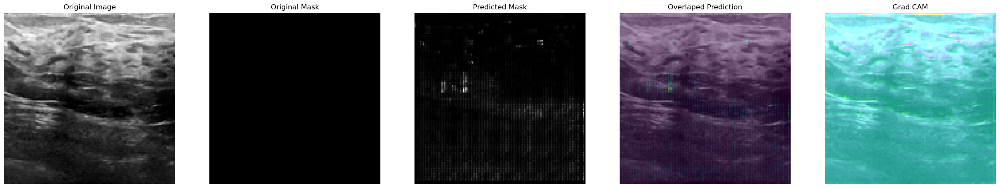

1/1 [==============================] - 0s 29ms/step


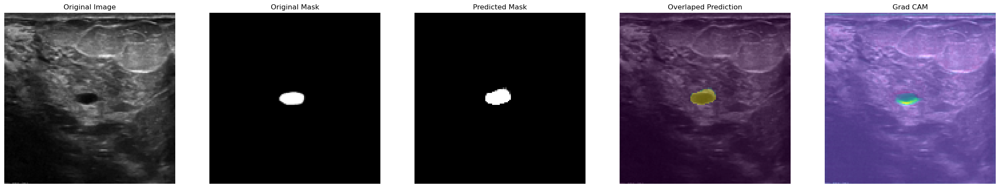

1/1 [==============================] - 0s 28ms/step


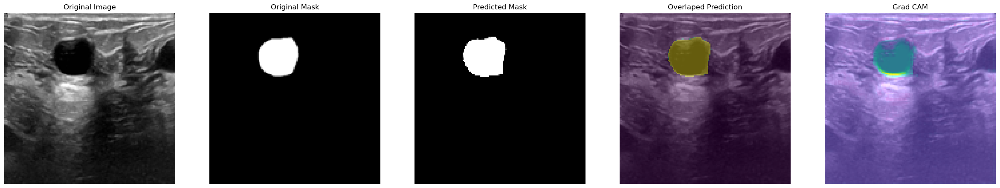

1/1 [==============================] - 0s 23ms/step


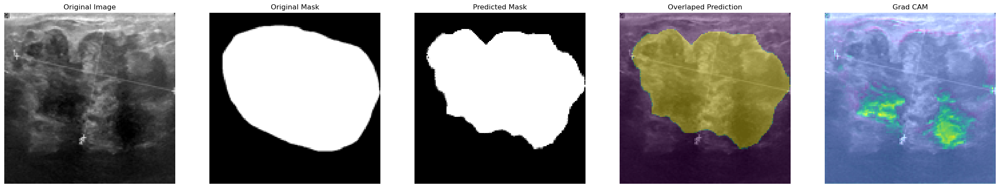

In [13]:
show_images(train_data, model=attemption_residual_unet, explain=True)

In [14]:
y_pred = attemption_residual_unet.predict(X_test) > 0.8

3/3 [==============================] - 0s 103ms/step


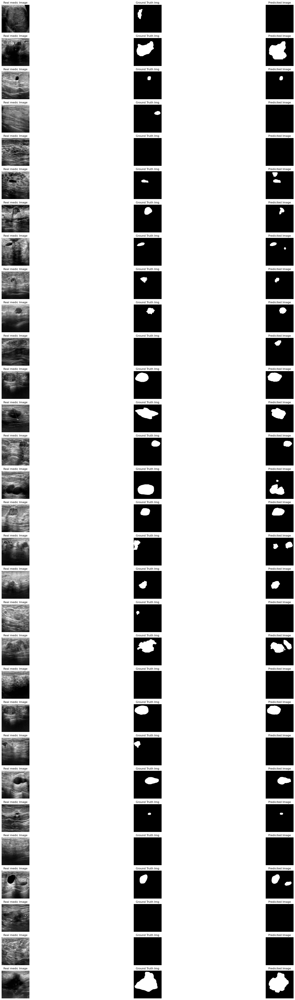

In [15]:
plt.figure(figsize = (30,80))

i = 0
x = 0
while i < 90 :
    
    plt.subplot(30,3,i+1)
    plt.imshow(X_test[x], 'gray')
    plt.title('Real medic Image')
    plt.axis('off')
    
    plt.subplot(30,3,i+2)
    plt.imshow(y_test[x], 'gray')
    plt.title('Ground Truth Img')
    plt.axis('off')
    
    plt.subplot(30,3,i+3)
    plt.imshow(y_pred[x], 'gray')
    plt.title('Predicited Image')
    plt.axis('off')
    
    x += 1
    i += 3
plt.show()

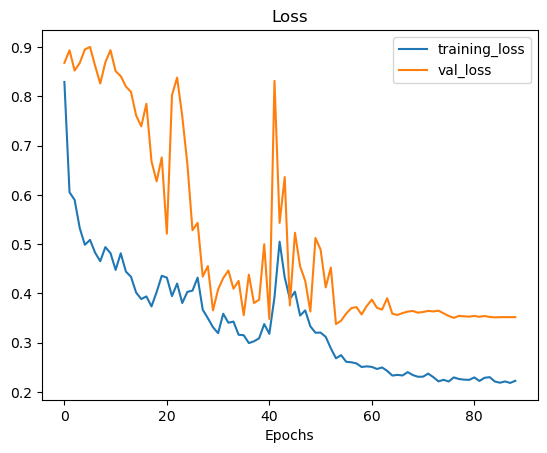

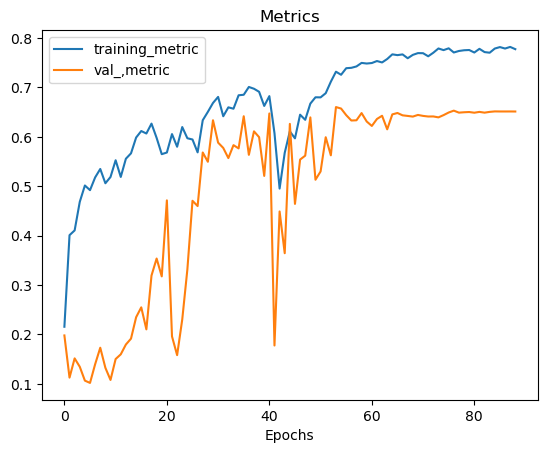

In [16]:
plot_loss_curves(history)

1/1 [==============================] - 0s 23ms/step


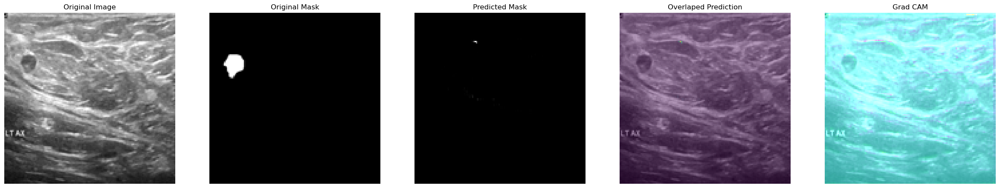

1/1 [==============================] - 0s 26ms/step


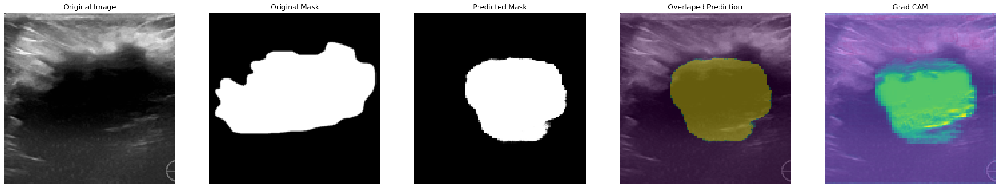

1/1 [==============================] - 0s 22ms/step


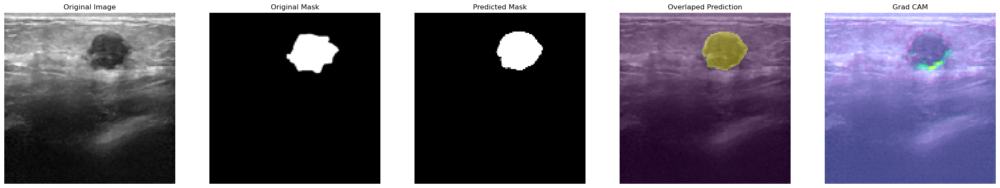

1/1 [==============================] - 0s 25ms/step


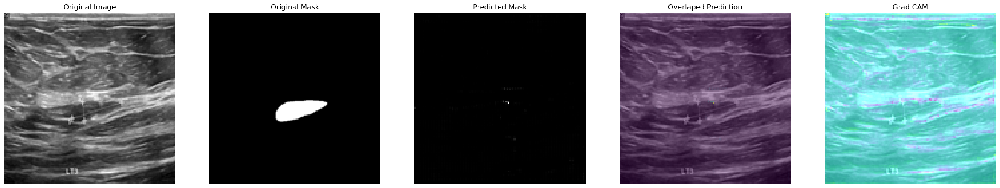

1/1 [==============================] - 0s 22ms/step


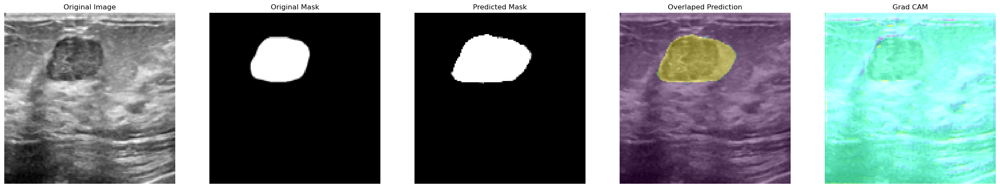

In [17]:
show_images(test_data, model=attemption_residual_unet, explain=True, n_images=5)